# New Veterinary Clinic in Toronto
By Thibault D. 03/03/2019

<img src="https://www.uplacevet.com/wp-content/uploads/sites/13/2018/10/logobig.png" style="height:500px">
credit: https://www.uplacevet.com/

## Table of Content

1. Introduction
2. Load Tools
3. Data Import
    3.a. Census Data  
    3.b. Animal Registry  
    3.c. Toronto Neighborhoods  
4. Data Cleaning and Combination
    4.a. Neighborhood  
    4.b. Census Data    
    4.c Animal Registry    
    4.d Final Filtering  
5. Existing Vaterinarians
6. Feature Engineering
7. Exploration and Analysis
    7.a. Population Distribution  
    7.b. Animal Distribution  
    7.c. Change in Animal Registration  
    7.d. Vet distribution  
    7.e. Cat vs Dog Friendly Neighborhoods  
    7.f. Feature correlations  
8. Clustering  

## 1. Introdution  
  
As a consultant specialized in helping new businesses to start in the Toronto area, we are often requiered to look at the status of the current market to provide valuable advice to our client. In this case, we were contacted to perform a survey of the veterinarian market in the city of Toronto. Our client wants to find us to recommend a good candidate neighborhood to start open their veterinarian clinic.  
Our analysis will be divided in the following phases:  
1. Gather data
2. Get usefull insights of the current status of the vet market
3. Leverage machine learning technic to identify areas lacking veterinarians

## 2. Load Tools

In this section, we load the libraries that we will be using during this project.

In [6]:
# data structures
print('Loading....')
import numpy as np
print('\tnumpy:\t\t',np.__version__)
import pandas as pd
print('\tpandas:\t\t',pd.__version__)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# plot libraries
import matplotlib
print('\tmatplotlib:\t',matplotlib.__version__)
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns
print('\tseaborn:\t',sns.__version__)
plt.style.use('ggplot')

# geolocalization
import folium
print('\tfolium:\t\t',folium.__version__)
import geocoder
print('\tgeocoder:\t',geocoder.__version__)
from geopy.geocoders import Nominatim

# url fetch
import requests
print('\trequests:\t',requests.__version__)
from pandas.io.json import json_normalize

# scrapping
import bs4
from bs4 import BeautifulSoup
print('\tbs4:\t\t',bs4.__version__)

# python
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# sklearn
import sklearn
print('\tsklearn:\t',sklearn.__version__)
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

Loading....
	numpy:		 1.13.3
	pandas:		 0.21.0
	matplotlib:	 2.1.0
	seaborn:	 0.8.0
	folium:		 0.8.2
	geocoder:	 1.38.1
	requests:	 2.18.4
	bs4:		 4.6.0
	sklearn:	 0.19.1


## 3. Data Import

### 3.a. Census Data

The census data is retrieved from the database made available by the city of Toronto.

The census data dated from 2016 is used. It is loaded as a *.csv file.  
https://www12.statcan.gc.ca/census-recensement/2016/dp-pd/hlt-fst/pd-pl/comprehensive.cfm

In [7]:
# URL to CSV from the governement of Canada: FSA census of 2016
print('Loading census data...')
URL_census = 'https://www12.statcan.gc.ca/census-recensement/2016/dp-pd/hlt-fst/pd-pl/Tables/CompFile.cfm?Lang=Eng&T=1201&OFT=FULLCSV'
print('...Census data loaded')

Loading census data...
...Census data loaded


We inspect the head of the dataframe in order to determine what features are contained in the dataset.

In [8]:
df_census_raw = pd.read_csv(URL_census)
df_census_raw.head()

,Geographic code,Geographic name,Province or territory,"Incompletely enumerated Indian reserves and Indian settlements, 2016","Population, 2016","Total private dwellings, 2016","Private dwellings occupied by usual residents, 2016"
0,01,Canada,NaN,T,35151728.0,15412443.0,14072079.0
1,A0A,A0A,Newfoundland and Labrador,NaN,46587.0,26155.0,19426.0
2,A0B,A0B,Newfoundland and Labrador,NaN,19792.0,13658.0,8792.0
3,A0C,A0C,Newfoundland and Labrador,NaN,12587.0,8010.0,5606.0
4,A0E,A0E,Newfoundland and Labrador,NaN,22294.0,12293.0,9603.0


We inspec the properties of the dataset using the .info() function and .shape attribute.

In [9]:
df_census_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648 entries, 0 to 1647
Data columns (total 7 columns):
Geographic code                                                         1648 non-null object
Geographic name                                                         1643 non-null object
Province or territory                                                   1641 non-null object
Incompletely enumerated Indian reserves and Indian settlements, 2016    1 non-null object
Population, 2016                                                        1642 non-null float64
Total private dwellings, 2016                                           1642 non-null float64
Private dwellings occupied by usual residents, 2016                     1642 non-null float64
dtypes: float64(3), object(4)
memory usage: 90.2+ KB


The next step is to look at missing and null values. We count how many values are null for each feature.

In [10]:
df_census_raw.isna().sum(axis=0)

Geographic code                                                            0
Geographic name                                                            5
Province or territory                                                      7
Incompletely enumerated Indian reserves and Indian settlements, 2016    1647
Population, 2016                                                           6
Total private dwellings, 2016                                              6
Private dwellings occupied by usual residents, 2016                        6
dtype: int64

In [11]:
print("The census data contains {} rows and {} columns.".format(df_census_raw.shape[0],df_census_raw.shape[1]))

The census data contains 1648 rows and 7 columns.


We remove columns that are not meant to be used in this study, we keep:  
 - Geographic code
 - Population, 2016
 - Private dwellings occupied by usual residents, 2016

**Note:** we only keep the population and the dwelling count features from the census data.

In [12]:
df_census_raw = df_census_raw[['Geographic code','Population, 2016','Private dwellings occupied by usual residents, 2016']]
df_census_raw.head()

,Geographic code,"Population, 2016","Private dwellings occupied by usual residents, 2016"
0,01,35151728.0,14072079.0
1,A0A,46587.0,19426.0
2,A0B,19792.0,8792.0
3,A0C,12587.0,5606.0
4,A0E,22294.0,9603.0


### 3.b. Animal Registry

The city of Toronto website contains the cat and dog registry for the years 2013 through 2017.  
  
https://www.toronto.ca/ext/open_data/catalog/data_set_files/2017_dog_and_cat_licence_FSA.xls  
https://www.toronto.ca/ext/open_data/catalog/data_set_files/2013%20licences%20sold%20by%20fsa.xls

In [13]:
# URL of the XLS files
URL_2017 = 'https://www.toronto.ca/ext/open_data/catalog/data_set_files/2017_dog_and_cat_licence_FSA.xls'
URL_2013 = 'https://www.toronto.ca/ext/open_data/catalog/data_set_files/2013%20licences%20sold%20by%20fsa.xls'

URL_animal = [URL_2013,URL_2017]

In [14]:
# load all the XLS files
list_df = []
list_skiprows = [3,2,2,2,2]
list_skip_footer = [1,1,0,0,1]

# create list of DataFrame
print('Loading census data...')
for idx,url in enumerate(URL_animal):
    df = pd.read_excel(url,sheet_name='Sheet1',skiprows=list_skiprows[idx],skipfooter=list_skip_footer[idx])
    df.columns = ['FSA','CAT','DOG','TOTAL']
    df['Year'] = idx*4+2013
    list_df.append(df)
print('...Animal registration data loaded.')

Loading census data...
...Animal registration data loaded.


Let's print the shape of the dataframe and explore the nature of its features.

In [15]:
# combine the dataFrames
df_animals = list_df[0].merge(list_df[1],on='FSA',suffixes=('_2013','_2017'))
print("The animal registry data contains {} rows and {} columns.".format(df_animals.shape[0],df_animals.shape[1]))

The animal registry data contains 97 rows and 9 columns.


In [16]:
print('Dataset info:')
print(' ')
df_animals.info()

Dataset info:
 
<class 'pandas.core.frame.DataFrame'>
Int64Index: 97 entries, 0 to 96
Data columns (total 9 columns):
FSA           97 non-null object
CAT_2013      97 non-null int64
DOG_2013      97 non-null int64
TOTAL_2013    97 non-null int64
Year_2013     97 non-null int64
CAT_2017      97 non-null int64
DOG_2017      97 non-null int64
TOTAL_2017    97 non-null int64
Year_2017     97 non-null int64
dtypes: int64(8), object(1)
memory usage: 7.6+ KB


In [17]:
df_animals = df_animals.drop(['Year_2013','Year_2017'],axis=1)
df_animals.head()

,FSA,CAT_2013,DOG_2013,TOTAL_2013,CAT_2017,DOG_2017,TOTAL_2017
0,M1B,293,674,967,285,627,912
1,M1C,387,967,1354,297,775,1072
2,M1E,536,1085,1621,467,963,1430
3,M1G,252,457,709,220,385,605
4,M1H,184,361,545,155,309,464


**Note:** We keep the data as is for now. We will combine the number of animals per neighborhood late.

### 3.c. Toronto Neighborhoods

#### 3.c.1 Wikipedia Scrapping

The toronto neighborhoods are retrived from the Wikipedia page:  
https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M  

In this section, we use the BeautifulSoup library to extract the table containing the list of Neighborhood in Toronto.
The following steps are followed:
1. Create a soup object that contains the webpage data.
2. Retrieve the subset of HTML code which contains the table data.
3. Extract the headers from the table.
4. Extract the content of the table.

**Step 1: Create a soup object that contains the webpage data.**

In [18]:
# url to be scrapped
URL_toronto = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'

# GET request
request = requests.get(URL_toronto)
data = request.text

# convert request to soup
soup = BeautifulSoup(data, "lxml")
print('BeautifulSoup created...')

BeautifulSoup created...


**Step 2: Retrieve the subset of HTML code which contains the table data.**

In [19]:
# extract the table
match = soup.find('table',class_='wikitable sortable')
print('Table found...')

Table found...


**Step 3: Extract the headers from the table.**

In [20]:
# create new dataframe used to store the table data
df_toronto_postal = pd.DataFrame(columns=['PostalCode', 'Borough', 'Neighborhood'])
print('DataFrame instantiated...')

DataFrame instantiated...


**Step 4: Extract the content of the table.**

In [21]:
# fetch table rows tr
data_rows = soup.find('table',class_='wikitable sortable').find('tbody').find_all('tr')

# fetch table cells td
for data_row in data_rows:
    data_split = data_row.find_all('td')

    if len(data_split)>0:
        postcode = data_split[0].text.strip()
        borough = data_split[1].text.strip()
        neighborhood = data_split[2].text.strip()
        
        df_toronto_postal = df_toronto_postal.append({'PostalCode':postcode,
                                        'Borough':borough,
                                        'Neighborhood':neighborhood},ignore_index=True)
print('DataFrame populated...')

DataFrame populated...


In [22]:
print("The neighborhood database contains {} rows and {} columns.".format(df_toronto_postal.shape[0],df_toronto_postal.shape[1]))

The neighborhood database contains 289 rows and 3 columns.


Let's print the shape of the dataframe and explore the nature of its features.

In [23]:
print('Dataset info:')
print(' ')
df_toronto_postal.info()

Dataset info:
 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 289 entries, 0 to 288
Data columns (total 3 columns):
PostalCode      289 non-null object
Borough         289 non-null object
Neighborhood    289 non-null object
dtypes: object(3)
memory usage: 6.9+ KB


In [24]:
df_toronto_postal.head()

,PostalCode,Borough,Neighborhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,Harbourfront


#### 3.c.2 Data cleanup

In this section, the data is processed and invalid data is eliminated. The following steps are applied:
1. Delete row where the Borough is defined as **"Not assigned"**
2. Concatenate neighborhoods with the same PostalCode
3. Replace unassigned Neighborhood by the Borough name
4. We display the shape of the cleaned DataFrame

**Step 1: Delete row where the Borough is defined as "Not assigned"**

In [25]:
# Step 1: Delete invalid input
df_toronto_postal = df_toronto_postal[df_toronto_postal['Borough']!='Not assigned'].reset_index(drop=True)
print('Unassigned neighborhoods have been removed...')

Unassigned neighborhoods have been removed...


**Step 2: Concatenate neighborhoods with the same PostalCode**

In [26]:
# Step 2: group by PostalCode and Borough, then concatenate the Neighborhoods.
df_toronto_postal = df_toronto_postal.groupby(['PostalCode','Borough'])['Neighborhood'].apply(lambda x: ', '.join(x)).reset_index()
print('Neighborhoods sharing same postal code have been merged...')

Neighborhoods sharing same postal code have been merged...


We verify that there are no longer any duplicates in the 'PostalCode' columns.

In [27]:
print('Checking for duplicates...')
print('Are there PostalCode duplicates?',~df_toronto_postal['PostalCode'].value_counts().max()==1)

Checking for duplicates...
Are there PostalCode duplicates? False


**Step 3: Replace unassigned Neighborhood by the Borough name**

In [28]:
# display record without Neighborhood
print('List of location without a neighborhood name but a borough name:')
df_toronto_postal[df_toronto_postal['Neighborhood'].str.contains('Not assigned')]

List of location without a neighborhood name but a borough name:


,PostalCode,Borough,Neighborhood
85,M7A,Queen's Park,Not assigned


Only one record contains an unassigned Neighborhood name. We replace the missing neighborhood name with the name of the Borough.

In [29]:
df_toronto_postal.loc[df_toronto_postal['Neighborhood'].str.contains('Not assigned'),'Neighborhood'] = df_toronto_postal.loc[df_toronto_postal['Neighborhood'].str.contains('Not assigned'),'Borough']
print('Neighborhoods without assigned named have been replaced by their borough name...')

Neighborhoods without assigned named have been replaced by their borough name...


We verify that the data is now cleaned:

In [30]:
print('Checking for unassigned Neighborhood...')
print('Are there unassigned neighborhood?',~df_toronto_postal[df_toronto_postal['Neighborhood'].str.contains('Not assigned')]['Neighborhood'].count()==1)

Checking for unassigned Neighborhood...
Are there unassigned neighborhood? False


**Step 4: Verification**

In [31]:
print("There are {} records in the DataFrame".format(df_toronto_postal.shape[0]))

There are 103 records in the DataFrame


In [32]:
print("The shape of the DataFrame is:")
print(df_toronto_postal.shape)

The shape of the DataFrame is:
(103, 3)


In [33]:
df_toronto_postal.head()

,PostalCode,Borough,Neighborhood
0,M1B,Scarborough,"Rouge, Malvern"
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae


## 4. Data Cleaning and Combination

### 4.a. Neighborhood

We need to verify that we have population data for all the postal codes stored in the *df_toronto_postal* dataframe. Since the census data encompass more than just the Toronto area, it needs to be filtered down.

In [34]:
print("There are {} postal codes in the df_toronto_postal DataFrame.".format(df_toronto_postal.shape[0])) 
print("There are {} postal codes in the df_census_raw DataFrame.".format(df_census_raw.shape[0]))

There are 103 postal codes in the df_toronto_postal DataFrame.
There are 1648 postal codes in the df_census_raw DataFrame.


In [35]:
print("Out of {} neighborhood in the df_toronto_postal DF, {} are also listed in the census dataset.".format(df_toronto_postal.shape[0],
                                                                                                             df_census_raw[df_census_raw['Geographic code'].isin(df_toronto_postal['PostalCode'])].shape[0]))

Out of 103 neighborhood in the df_toronto_postal DF, 102 are also listed in the census dataset.


List the neighborhood that does not belong to the census data.

In [36]:
df_toronto_postal[~df_toronto_postal['PostalCode'].isin(df_census_raw['Geographic code'])]

,PostalCode,Borough,Neighborhood
86,M7R,Mississauga,Canada Post Gateway Processing Centre


Upon some research on Google Maps and Wikipedia, it appears that this is a very small neighborhood (1 city blocj). Therefore, we remove it from the dataset.

In [37]:
df_toronto_postal = df_toronto_postal[df_toronto_postal['PostalCode'].isin(df_census_raw['Geographic code'])]

### 4.b. Census Data  

First, we filter the records to keep only the neighborhood also located in teh df_census_raw dataframe.

In [38]:
df_census_raw = df_census_raw[df_census_raw['Geographic code'].isin(df_toronto_postal['PostalCode'])]
print("There are {} neighborhoods in the census dataframe.".format(df_census_raw.shape))

There are (102, 3) neighborhoods in the census dataframe.


In [39]:
print("There are {} neighborhoods in the postal code dataframe.".format(df_toronto_postal.shape))

There are (102, 3) neighborhoods in the postal code dataframe.


In [40]:
print("There are {} unique postal codes in the census data frame.".format(len(df_census_raw['Geographic code'].unique())))

There are 102 unique postal codes in the census data frame.


In [41]:
print("There are {} unique postal codes in the postal code data frame.".format(len(df_toronto_postal['PostalCode'].unique())))

There are 102 unique postal codes in the postal code data frame.


In [42]:
print('Census neighborhood not in the postal dataframe:')
df_census_raw[~df_census_raw['Geographic code'].isin(df_toronto_postal['PostalCode'])]

Census neighborhood not in the postal dataframe:


,Geographic code,"Population, 2016","Private dwellings occupied by usual residents, 2016"


In [43]:
print('Postal records not in the census dataframe:')
df_toronto_postal[~df_toronto_postal['PostalCode'].isin(df_census_raw['Geographic code'])]

Postal records not in the census dataframe:


,PostalCode,Borough,Neighborhood


**Note:** We inspect the population of the neighborhoods to determine if the data contains outliers.

In [44]:
df_census_raw.describe()

,"Population, 2016","Private dwellings occupied by usual residents, 2016"
count,102.000000,102.000000
mean,26785.676471,10913.382353
std,15160.057881,6217.451068
min,0.000000,1.000000
25%,16717.000000,7110.250000
50%,24866.500000,10395.000000
75%,36933.000000,14704.500000
max,75897.000000,33765.000000


**Note:** Several of the neihgborhoods have a very small population (15). We inspect these records.

In [45]:
df_census_raw[(df_census_raw['Population, 2016']<15) | (df_census_raw['Private dwellings occupied by usual residents, 2016']<15)]

,Geographic code,"Population, 2016","Private dwellings occupied by usual residents, 2016"
955,M5K,0.0,1.0
956,M5L,0.0,1.0
964,M5W,15.0,9.0
965,M5X,10.0,3.0
980,M7A,10.0,5.0
981,M7Y,10.0,7.0


**Note:** We delete these records.

In [46]:
df_census_raw = df_census_raw[(df_census_raw['Population, 2016']>15) & (df_census_raw['Private dwellings occupied by usual residents, 2016']>15)].reset_index(drop=True)

**Note:** We inspect the data to validate its content.

In [47]:
df_census_raw.sort_values(by='Population, 2016',ascending=True).head(15)

,Geographic code,"Population, 2016","Private dwellings occupied by usual residents, 2016"
58,M5H,2005.0,1243.0
55,M5C,2951.0,1721.0
30,M3K,5997.0,2208.0
23,M2P,7843.0,3020.0
57,M5G,8423.0,4929.0
56,M5E,9118.0,5682.0
48,M4T,10463.0,5212.0
83,M8X,10787.0,4523.0
46,M4R,11394.0,5036.0
20,M2L,11717.0,3974.0


**Note:** The data now makes sense.

### 4.c Animal Registry  
Since we have data dated from 2013 to 2017, we need to confirm that we have the number of registered pets for each year and for each neighborhood.

In [48]:
# original shape
print("The animal registry data contains {} rows and {} columns.".format(df_animals.shape[0],df_animals.shape[1]))

The animal registry data contains 97 rows and 7 columns.


We filter the animal registry records to only keep the ones for which the postal code is contained in the postal code and the census data frames.

In [49]:
# filter neighborhoods
df_animals = df_animals[df_animals['FSA'].isin(df_census_raw['Geographic code'])]
print('After match with the census dataset:')
print("The animal registry data contains {} rows and {} columns.".format(df_animals.shape[0],df_animals.shape[1]))

After match with the census dataset:
The animal registry data contains 96 rows and 7 columns.


**Note:** We have data for each year and each neighborhood. We now group the data by summing each features per neighborhood.

Let's plot the total number of registered pets during each year.

In [50]:
df_sum_pets = df_animals.sum(axis=0).to_frame().T.drop(['FSA','TOTAL_2017','TOTAL_2013'],axis=1).T
df_sum_pets['Year'] = df_sum_pets.index.str[-4:]
df_sum_pets.columns=['Sum','Year']
df_sum_pets = df_sum_pets.reset_index()
df_sum_pets['index'] = df_sum_pets['index'].str[0:-5]
df_sum_pets = pd.pivot_table(df_sum_pets,values='Sum',index='Year',columns='index',aggfunc=np.sum)
df_sum_pets

index,CAT,DOG
Year,,
2013,25737,54864
2017,24489,56459


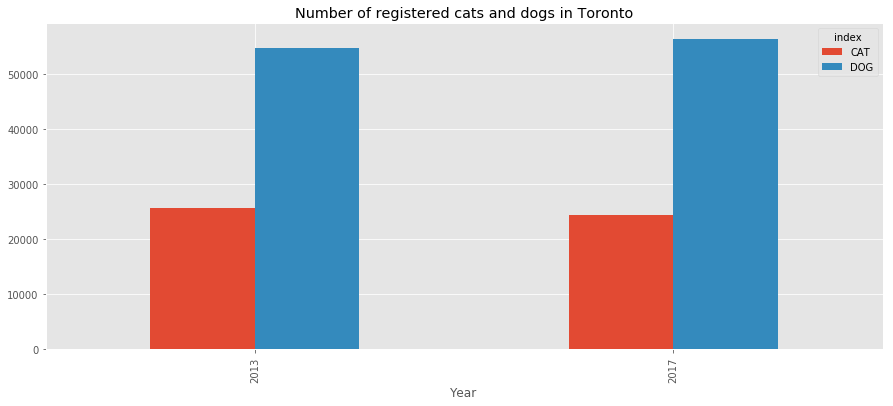

In [51]:
df_sum_pets.plot(kind='bar',
                     figsize=(15,6),
                     title='Number of registered cats and dogs in Toronto');

### 4.d Final Filtering

Before performing any analysis, we need to verify that each dataset contains the same set of postalcodes.

In [52]:
print("The animal registry data contains {} rows and {} columns.".format(df_animals.shape[0],df_animals.shape[1]))

The animal registry data contains 96 rows and 7 columns.


In [53]:
print("The census dataset contains {} rows and {} columns.".format(df_census_raw.shape[0],df_census_raw.shape[1]))

The census dataset contains 96 rows and 3 columns.


In [54]:
print("The postal dataset contains {} rows and {} columns.".format(df_toronto_postal.shape[0],df_toronto_postal.shape[1]))

The postal dataset contains 102 rows and 3 columns.


We display the ones that do not appear in all three sets.

In [55]:
df_toronto_postal[(~df_toronto_postal['PostalCode'].isin(df_animals['FSA']))]

,PostalCode,Borough,Neighborhood
60,M5K,Downtown Toronto,"Design Exchange, Toronto Dominion Centre"
61,M5L,Downtown Toronto,"Commerce Court, Victoria Hotel"
69,M5W,Downtown Toronto,Stn A PO Boxes 25 The Esplanade
70,M5X,Downtown Toronto,"First Canadian Place, Underground city"
85,M7A,Queen's Park,Queen's Park
87,M7Y,East Toronto,Business Reply Mail Processing Centre 969 Eastern


**Note:** These are neighborhoods that we have removed because they only conaints fewer than 15 inhabitants. We remove these records from the toronto postal data.

In [56]:
df_toronto_postal = df_toronto_postal[(df_toronto_postal['PostalCode'].isin(df_animals['FSA']))]
print('After cleaning:')
print("The postal dataset contains {} rows and {} columns.".format(df_toronto_postal.shape[0],df_toronto_postal.shape[1]))

After cleaning:
The postal dataset contains 96 rows and 3 columns.


We now have datasets that can be merged together. Before we do, we will add additional features. For instance, we want to add the latitude and longitude to the df_toronto_postal dataframe.

In [57]:
df_zip_toronto = pd.DataFrame(columns = list(df_toronto_postal.columns)+['Latitude','Longitude'])
print('Instantiate new dataframe:')
df_zip_toronto

Instantiate new dataframe:


,PostalCode,Borough,Neighborhood,Latitude,Longitude


In order to geolocalize the neighborhood, we use the ARCGIS Service intead of the geocoder.google. ARCGIS is more reliable and gives accurate results after a single call to the API.

Geocoder Documentation:
https://media.readthedocs.org/pdf/geocoder/latest/geocoder.pdf

In [58]:
# set counter of API calls
api_calls = 0

for postalcode, borough, neighborhood in zip(df_toronto_postal['PostalCode'],df_toronto_postal['Borough'],df_toronto_postal['Neighborhood']):  
    # initialize your variable to None
    lat_lng_coords = None

    # loop until you get the coordinates
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, Toronto, Ontario,Canada'.format(postalcode))
        lat_lng_coords = g.latlng
        api_calls+=1

    latitude = lat_lng_coords[0]
    longitude = lat_lng_coords[1]
    
    df_zip_toronto = df_zip_toronto.append({
        'PostalCode':postalcode,
        'Borough':borough,
        'Neighborhood':neighborhood,
        'Latitude':latitude,
        'Longitude':longitude
    },ignore_index=True)
    
print('All locations have been retrieved.')
print('{} calls to the API were made.'.format(api_calls))

All locations have been retrieved.
96 calls to the API were made.


In [59]:
print('New DataFrame populated with the latitude and longitude of each neighborhood:')
df_zip_toronto.head()

New DataFrame populated with the latitude and longitude of each neighborhood:


,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Rouge, Malvern",43.811650,-79.195561
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.785605,-79.158701
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.765690,-79.175299
3,M1G,Scarborough,Woburn,43.768216,-79.217610
4,M1H,Scarborough,Cedarbrae,43.769608,-79.239440


In [60]:
print('Animal dataset:')
df_animals.head()

Animal dataset:


,FSA,CAT_2013,DOG_2013,TOTAL_2013,CAT_2017,DOG_2017,TOTAL_2017
0,M1B,293,674,967,285,627,912
1,M1C,387,967,1354,297,775,1072
2,M1E,536,1085,1621,467,963,1430
3,M1G,252,457,709,220,385,605
4,M1H,184,361,545,155,309,464


In [61]:
print('Census dataset:')
df_census_raw.head()

Census dataset:


,Geographic code,"Population, 2016","Private dwellings occupied by usual residents, 2016"
0,M1B,66108.0,20230.0
1,M1C,35626.0,11274.0
2,M1E,46943.0,17161.0
3,M1G,29690.0,9767.0
4,M1H,24383.0,8985.0


**Note:** Before we merge our datasets, we want to simplify the feature names by changing the name of the dataframe columns.

In [62]:
df_animals.columns = ['PostalCode','CatCount_2013','DogCount_2013','TotalPets_2013','CatCount_2017','DogCount_2017','TotalPets_2017']
df_census_raw.columns = ['PostalCode','Population2016','Dwellings2016']
print('Animal and Census dataset columns have been renamed...')

Animal and Census dataset columns have been renamed...


**Note:** We now merge the dataframe into one unique set.

In [63]:
df_merged = df_zip_toronto.merge(df_census_raw,on='PostalCode')
df_merged = df_merged.merge(df_animals,on='PostalCode')
print('All three datasets have been merged...')

All three datasets have been merged...


In [64]:
print("The merged dataset contains {} rows and {} columns.".format(df_merged.shape[0],df_merged.shape[1]))

The merged dataset contains 96 rows and 13 columns.


In [65]:
print('Merged dataset:')
df_merged.head()

Merged dataset:


,PostalCode,Borough,Neighborhood,Latitude,Longitude,Population2016,Dwellings2016,CatCount_2013,DogCount_2013,TotalPets_2013,CatCount_2017,DogCount_2017,TotalPets_2017
0,M1B,Scarborough,"Rouge, Malvern",43.811650,-79.195561,66108.0,20230.0,293,674,967,285,627,912
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.785605,-79.158701,35626.0,11274.0,387,967,1354,297,775,1072
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.765690,-79.175299,46943.0,17161.0,536,1085,1621,467,963,1430
3,M1G,Scarborough,Woburn,43.768216,-79.217610,29690.0,9767.0,252,457,709,220,385,605
4,M1H,Scarborough,Cedarbrae,43.769608,-79.239440,24383.0,8985.0,184,361,545,155,309,464


## 5. Existing Veterinarians  
In this section, we use the Foursquare API to retrieve the location of veterniaries in the Toronto area. Note that the search is done using the latitude and longitude of each neighborhood, the distance used in the query is defined as 1500m. Even if it results in search resutlts that do not belong to the neighborhood, it corresponds to a distance that customer will be willing to travel to visit a veterinary.

In [66]:
# The code was removed by Watson Studio for sharing.

Foursquare credentials have been defined....


**Let's explore the first neighborhood in our dataframe.**  
Get the neighborhood's latitude and longitude values.

In [67]:
neighborhood_latitude = df_merged.loc[1, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = df_merged.loc[1, 'Longitude'] # neighborhood longitude value

neighborhood_name = df_merged.loc[1, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Highland Creek, Rouge Hill, Port Union are 43.78560500000003, -79.15870110299994.


**Now, let's get the top veterinaries that are in Highland Creek, Rouge Hill, Port Union within a radius of 1500 meters.**


In [68]:
# obtain top 100 venues in Rouge, Malvern wthin a radius of 1000 meters
radius = 2000
LIMIT = 50
VERSION = '20180604'
search_query = 'veterinarian'

url = 'https://api.foursquare.com/v2/venues/search?categoryId=4d954af4a243a5684765b473&client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(
    CLIENT_ID,
    CLIENT_SECRET,
    neighborhood_latitude,
    neighborhood_longitude,
    VERSION,
    radius,
    LIMIT)

The following is the JSON file obtained from query to the Foursquare API.

In [69]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5c7c24cb4434b95785e301a5'},
 'response': {'confident': True,
  'venues': [{'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/medical_veterinarian_',
       'suffix': '.png'},
      'id': '4d954af4a243a5684765b473',
      'name': 'Veterinarian',
      'pluralName': 'Veterinarians',
      'primary': True,
      'shortName': 'Veterinarians'}],
    'hasPerk': False,
    'id': '4c8a28641797236a09de5e88',
    'location': {'address': '5528 Lawrence Avenue East',
     'cc': 'CA',
     'city': 'Scarborough',
     'country': 'Canada',
     'distance': 1779,
     'formattedAddress': ['5528 Lawrence Avenue East',
      'Scarborough ON M1C 3B2',
      'Canada'],
     'labeledLatLngs': [{'label': 'display',
       'lat': 43.779939844328915,
       'lng': -79.13800246155462}],
     'lat': 43.779939844328915,
     'lng': -79.13800246155462,
     'postalCode': 'M1C 3B2',
     'state': 'ON'},
    'name': 'West Hill Animal Clinic',
  

In [70]:
print('The categorie of the venue is {}.'.format(results['response']['venues'][0]['categories'][0]['name']))

The categorie of the venue is Veterinarian.


In [71]:
# function that extracts the category of the venue
def get_category_type(row):
    """
    Function:
        Retrieve the category type from a venue.
    Input:
        Pandas DataFrame row.
    Output:
        Category name.
    """
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [72]:
def getNearbyVenues(postalcodes ,names, latitudes, longitudes, radius=3000):
    """
    Function:
        Use Foursquare API to retrive the top 100 venues associated to a neighborhood.
    Inputs:
        names: pandas Series containing the names of the neighborhoods.
        latitudes: pandas Series containting the latitudes of each neighborhood.
        longitudes: pandas Series containing the longitudes of each neighborhood.
        radius: maximum distance in meters between the center of the neighborhood and the venue.
    Outputs:
        pandas DataFrame containing the set of retrieved venues.
    """
    # initiate an empty list of venues
    venues_list=[]
    index = 1
    
    # loop through the data
    for postal, name, lat, lng in zip(postalcodes, names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/search?categoryId=4d954af4a243a5684765b473&client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(
            CLIENT_ID,
            CLIENT_SECRET,
            lat,
            lng,
            VERSION,
            radius,
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['venues']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            postal,
            name, 
            lat, 
            lng, 
            v['name'], 
            v['location']['lat'], 
            v['location']['lng'],  
            v['categories'][0]['name']) for v in results])
        
        print('{}. {}: {} DONE...{} venues found.'.format(index,postal,name,len(results)))
        index+=1

    # create DataFrame from the list of venues
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    # set DataFrame columns
    nearby_venues.columns = ['PostalCode',
                  'Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

We run the query unsing the Foursquare API to retrieve the veterinarians for each neighborhood.

In [73]:
df_toronto_vets = getNearbyVenues(postalcodes=df_merged['PostalCode'],
                                   names=df_merged['Neighborhood'],
                                   latitudes=df_merged['Latitude'],
                                   longitudes=df_merged['Longitude']
                                  )

1. M1B: Rouge, Malvern DONE...1 venues found.
2. M1C: Highland Creek, Rouge Hill, Port Union DONE...1 venues found.
3. M1E: Guildwood, Morningside, West Hill DONE...1 venues found.
4. M1G: Woburn DONE...5 venues found.
5. M1H: Cedarbrae DONE...5 venues found.
6. M1J: Scarborough Village DONE...5 venues found.
7. M1K: East Birchmount Park, Ionview, Kennedy Park DONE...7 venues found.
8. M1L: Clairlea, Golden Mile, Oakridge DONE...8 venues found.
9. M1M: Cliffcrest, Cliffside, Scarborough Village West DONE...6 venues found.
10. M1N: Birch Cliff, Cliffside West DONE...8 venues found.
11. M1P: Dorset Park, Scarborough Town Centre, Wexford Heights DONE...10 venues found.
12. M1R: Maryvale, Wexford DONE...5 venues found.
13. M1S: Agincourt DONE...6 venues found.
14. M1T: Clarks Corners, Sullivan, Tam O'Shanter DONE...9 venues found.
15. M1V: Agincourt North, L'Amoreaux East, Milliken, Steeles East DONE...6 venues found.
16. M1W: L'Amoreaux West, Steeles West DONE...4 venues found.
17. M1X: U

Let's look at the distribution of veterinarians.

In [74]:
df_toronto_vets.head(1)

,PostalCode,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,M1B,"Rouge, Malvern",43.81165,-79.195561,Malvern Veterinary Hospital,43.795586,-79.226581,Veterinarian


In [75]:
df_toronto_vets_count = df_toronto_vets['PostalCode'].value_counts()

In [76]:
print("The grouped venue dataset contains {} rows.".format(df_toronto_vets_count.shape[0]))

The grouped venue dataset contains 94 rows.


Two neighboorhood do not contain any venues, we identify them and add them manually in the venue count serie.

In [77]:
df_merged[~df_merged['PostalCode'].isin(df_toronto_vets_count.index)]

,PostalCode,Borough,Neighborhood,Latitude,Longitude,Population2016,Dwellings2016,CatCount_2013,DogCount_2013,TotalPets_2013,CatCount_2017,DogCount_2017,TotalPets_2017
16,M1X,Scarborough,Upper Rouge,43.834215,-79.216701,15097.0,3649.0,41,120,161,35,113,148
33,M3N,North York,Downsview Northwest,43.755356,-79.519590,41958.0,13841.0,129,237,366,152,314,466


In [78]:
temp = pd.Series({'M1X':0,'M3N':0})
df_toronto_vets_count = df_toronto_vets_count.append(temp)
print('After modifications:')
print("The grouped venue dataset contains {} rows.".format(df_toronto_vets_count.shape[0]))

After modifications:
The grouped venue dataset contains 96 rows.


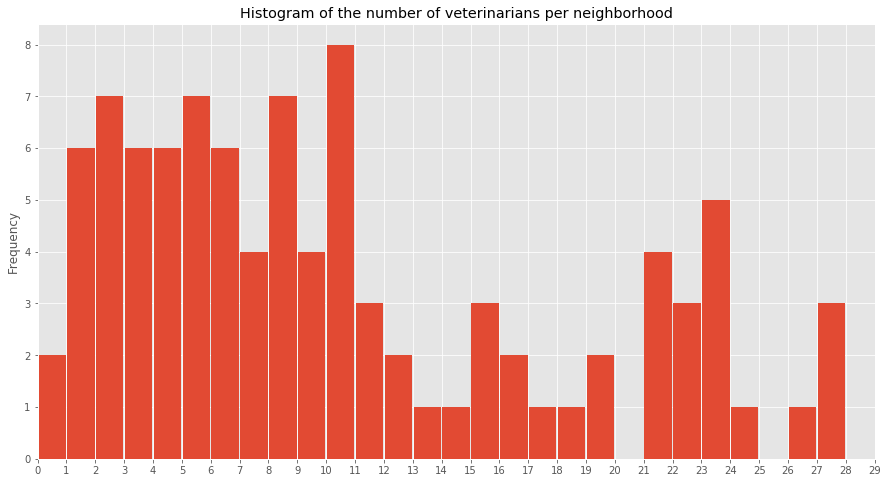

In [79]:
df_toronto_vets_count.plot(kind='hist',
                            figsize=(15,8),
                            title='Histogram of the number of veterinarians per neighborhood',
                            rwidth=0.95,
                            bins=28,
                            xticks=list(range(0,30)),
                            xlim=(0,29));

## 6. Feature Engineering  
  
In this section, we will combine the existing features to create new ones that are judged meaningfull for our study. The followings are added:

1. Numbber of veterinarians per 1000 inhabitants
2. Number of registered pets per 1000 inhabitants
3. Number of registered cats per 1000 inhabitants
4. Number of registered dogs per 1000 inhabitants
5. Number of vets per 1000 registered pets
6. Number of vets per 1000 registered inhabitants
7. Number of registered pets per 1000 dwellings
8. Number of vets per 1000 dwellings
9. Proportion of cats
10. Change in cat registration number
11. Change in dog registration number

We first merge the dataframe containing the sum of venues to the main dataframe.

In [80]:
df_toronto_vets_count = df_toronto_vets_count.to_frame().reset_index()
df_toronto_vets_count.columns=['PostalCode','TotalVets']
df_toronto_vets_count.head()

,PostalCode,TotalVets
0,M5S,28
1,M6J,28
2,M6G,27
3,M5R,26
4,M5G,24


In [81]:
df_merged = df_merged.merge(df_toronto_vets_count, on='PostalCode')

In [82]:
df_merged_final = df_merged.copy()

**FINAL DATASET**

In [83]:
df_merged_final.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude,Population2016,Dwellings2016,CatCount_2013,DogCount_2013,TotalPets_2013,CatCount_2017,DogCount_2017,TotalPets_2017,TotalVets
0,M1B,Scarborough,"Rouge, Malvern",43.811650,-79.195561,66108.0,20230.0,293,674,967,285,627,912,1
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.785605,-79.158701,35626.0,11274.0,387,967,1354,297,775,1072,1
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.765690,-79.175299,46943.0,17161.0,536,1085,1621,467,963,1430,1
3,M1G,Scarborough,Woburn,43.768216,-79.217610,29690.0,9767.0,252,457,709,220,385,605,5
4,M1H,Scarborough,Cedarbrae,43.769608,-79.239440,24383.0,8985.0,184,361,545,155,309,464,5


**Note:** We create new features

In [84]:
df_merged_final['CatPerThousandInhab_2017'] = df_merged_final['CatCount_2017'] / df_merged_final['Population2016'] * 1000
df_merged_final['DogPerThousandInhab_2017'] = df_merged_final['DogCount_2017'] / df_merged_final['Population2016'] * 1000
df_merged_final['PetPerThousandInhab_2017'] = df_merged_final['TotalPets_2017'] / df_merged_final['Population2016'] * 1000

df_merged_final['VetPerPet_2017'] = df_merged_final['TotalVets'] / df_merged_final['TotalPets_2017']
df_merged_final['VetPerInhab'] = df_merged_final['TotalVets'] / df_merged_final['Population2016']

df_merged_final['PetPerThousandDwelling_2017'] = df_merged_final['TotalPets_2017'] / df_merged_final['Dwellings2016'] * 1000
df_merged_final['VetPerThousandDwelling'] = df_merged_final['TotalVets'] / df_merged_final['Dwellings2016'] * 1000

df_merged_final['PropCats_2017'] = df_merged_final['CatCount_2017'] / df_merged_final['TotalPets_2017'] * 100
df_merged_final['PropDogs_2017'] = df_merged_final['DogCount_2017'] / df_merged_final['TotalPets_2017'] * 100
df_merged_final['PropCats_2013'] = df_merged_final['CatCount_2013'] / df_merged_final['TotalPets_2013'] * 100
df_merged_final['PropDogs_2013'] = df_merged_final['DogCount_2013'] / df_merged_final['TotalPets_2013'] * 100

df_merged_final['DeltaCats'] = df_merged_final['CatCount_2017'] - df_merged_final['CatCount_2013']
df_merged_final['DeltaDogs'] = df_merged_final['DogCount_2017'] - df_merged_final['DogCount_2013']
df_merged_final['DeltaPets'] = df_merged_final['TotalPets_2017'] - df_merged_final['TotalPets_2013']

**New features added to final dataset**

In [85]:
df_merged_final.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude,Population2016,Dwellings2016,CatCount_2013,DogCount_2013,TotalPets_2013,CatCount_2017,DogCount_2017,TotalPets_2017,TotalVets,CatPerThousandInhab_2017,DogPerThousandInhab_2017,PetPerThousandInhab_2017,VetPerPet_2017,VetPerInhab,PetPerThousandDwelling_2017,VetPerThousandDwelling,PropCats_2017,PropDogs_2017,PropCats_2013,PropDogs_2013,DeltaCats,DeltaDogs,DeltaPets
0,M1B,Scarborough,"Rouge, Malvern",43.811650,-79.195561,66108.0,20230.0,293,674,967,285,627,912,1,4.311127,9.484480,13.795607,0.001096,0.000015,45.081562,0.049432,31.250000,68.750000,30.299897,69.700103,-8,-47,-55
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.785605,-79.158701,35626.0,11274.0,387,967,1354,297,775,1072,1,8.336608,21.753775,30.090383,0.000933,0.000028,95.086039,0.088700,27.705224,72.294776,28.581979,71.418021,-90,-192,-282
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.765690,-79.175299,46943.0,17161.0,536,1085,1621,467,963,1430,1,9.948235,20.514241,30.462476,0.000699,0.000021,83.328477,0.058272,32.657343,67.342657,33.066009,66.933991,-69,-122,-191
3,M1G,Scarborough,Woburn,43.768216,-79.217610,29690.0,9767.0,252,457,709,220,385,605,5,7.409902,12.967329,20.377231,0.008264,0.000168,61.943278,0.511928,36.363636,63.636364,35.543018,64.456982,-32,-72,-104
4,M1H,Scarborough,Cedarbrae,43.769608,-79.239440,24383.0,8985.0,184,361,545,155,309,464,5,6.356888,12.672764,19.029652,0.010776,0.000205,51.641625,0.556483,33.405172,66.594828,33.761468,66.238532,-29,-52,-81


## 7. Exploration and Analysis

In this section we will create several map plots. In order to understrand feature distribution across the various neighborhoods, vizualisation tools are used.  

In [86]:
# url to be scrapped
URL_geojson = 'https://raw.githubusercontent.com/ag2816/Visualizations/master/data/Toronto2.geojson'

# GET request
request = requests.get(URL_geojson)
data = request.text
print('GEOJSON file loadded...')

GEOJSON file loadded...


### 7.a. Population Distribution

Usign Folium, we plot the population distribution in the Toronto area:

In [87]:
LATITUDE, LONGITUDE = [43.722898, -79.381049]
print('The latitude and longitude of Toronto are {}, {}'.format(LATITUDE,LONGITUDE))

The latitude and longitude of Toronto are 43.722898, -79.381049


In [88]:
state_geo = data

m = folium.Map(location=[LATITUDE,LONGITUDE], zoom_start=11)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=df_merged_final,
    columns=['PostalCode', 'Population2016'],
    key_on='feature.properties.CFSAUID',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Total Population'
).add_to(m)

folium.LayerControl().add_to(m)

m

### 7.b. Animal Distribution

In [89]:
print('Neighborhoods with largest pet ratio (pet per thousand people:)')
df_merged_final[['PostalCode','Borough','Neighborhood','PetPerThousandInhab_2017']].sort_values(by='PetPerThousandInhab_2017',ascending=False).head(3)

Neighborhoods with largest pet ratio (pet per thousand people:)


,PostalCode,Borough,Neighborhood,PetPerThousandInhab_2017
37,M4E,East Toronto,The Beaches,64.326785
79,M6R,West Toronto,"Parkdale, Roncesvalles",60.281009
82,M8W,Etobicoke,"Alderwood, Long Branch",58.769469


In [90]:
print('Neighborhoods with smallest pet ratio (pet per thousand people:)')
df_merged_final[['PostalCode','Borough','Neighborhood','PetPerThousandInhab_2017']].sort_values(by='PetPerThousandInhab_2017',ascending=True).head(3)

Neighborhoods with smallest pet ratio (pet per thousand people:)


,PostalCode,Borough,Neighborhood,PetPerThousandInhab_2017
39,M4H,East York,Thorncliffe Park,6.399837
16,M1X,Scarborough,Upper Rouge,9.803272
33,M3N,North York,Downsview Northwest,11.106344


**Notes**:
 - Above are listed with three neighborhoods with the highest and lowest nuber of pets per thoushand people.  
 - The highest ownership rate is 64 pets for one thoushand people in "The Beaches".  
 - The lowest ownership rate is 6 pets for one thoushand people in "Thorncliffe Park".

### 7.c. Change in Animal Registration

In [91]:
state_geo = data

m = folium.Map(location=[LATITUDE,LONGITUDE], zoom_start=11)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=df_merged_final,
    columns=['PostalCode', 'DeltaPets'],
    key_on='feature.properties.CFSAUID',
    fill_color='BuGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Change in number of registered animals between 2013 and 2017'
).add_to(m)

folium.LayerControl().add_to(m)

m

From the above map, we can see that on average, neighborhoods tend to have the same number of pets. However, there are a few extreme cases.

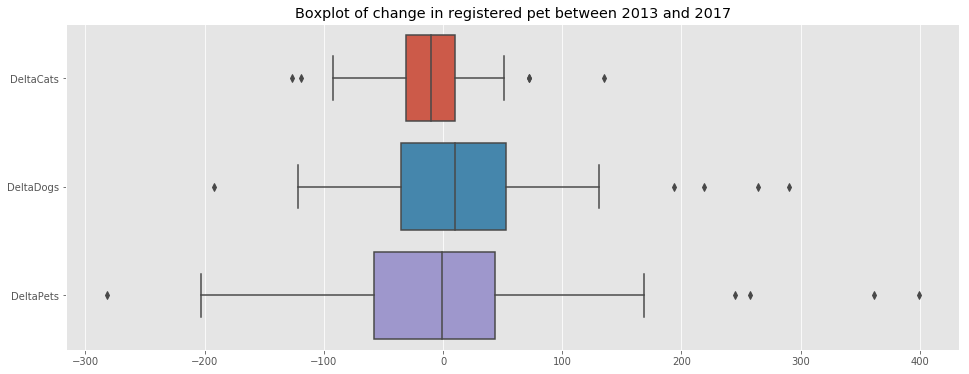

In [92]:
f, ax = plt.subplots(figsize=(16,6))
ax.set_title('Boxplot of change in registered pet between 2013 and 2017')
sns.boxplot(data=df_merged_final[['DeltaCats','DeltaDogs','DeltaPets']],ax=ax,orient='h');

The following observations can be made from the above plot:
1. On average, the number of cats per neighborhood seems to decrease.
2. On average, the number of dogs per neighborhood seems to decrease.

In [93]:
state_geo = data

m = folium.Map(location=[LATITUDE,LONGITUDE], zoom_start=11)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=df_merged_final,
    columns=['PostalCode', 'DeltaCats'],
    key_on='feature.properties.CFSAUID',
    fill_color='BuGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Change in number of registered cats between 2013 and 2017'
).add_to(m)

folium.LayerControl().add_to(m)

m

In [94]:
state_geo = data

m = folium.Map(location=[LATITUDE,LONGITUDE], zoom_start=11)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=df_merged_final,
    columns=['PostalCode', 'DeltaDogs'],
    key_on='feature.properties.CFSAUID',
    fill_color='BuGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Change in number of registered dogs between 2013 and 2017'
).add_to(m)

folium.LayerControl().add_to(m)

m

### 7.d. Vet distribution

In this section, we will look at the distribution of vet in the city. Let's start by looking at the neighborhoods with the highest and lowest veterinarians per people.

In [95]:
df_merged_final[['PostalCode','Borough','Neighborhood','VetPerInhab']].sort_values(by='VetPerInhab',ascending=True).head(3)

,PostalCode,Borough,Neighborhood,VetPerInhab
33,M3N,North York,Downsview Northwest,0.000000
16,M1X,Scarborough,Upper Rouge,0.000000
0,M1B,Scarborough,"Rouge, Malvern",0.000015


In [96]:
df_merged_final[['PostalCode','Borough','Neighborhood','VetPerInhab']].sort_values(by='VetPerInhab',ascending=False).head(3)

,PostalCode,Borough,Neighborhood,VetPerInhab
58,M5H,Downtown Toronto,"Adelaide, King, Richmond",0.010474
55,M5C,Downtown Toronto,St. James Town,0.007116
57,M5G,Downtown Toronto,Central Bay Street,0.002849


We plot the data to get a better understanding of the distribution of vets throughout the city.

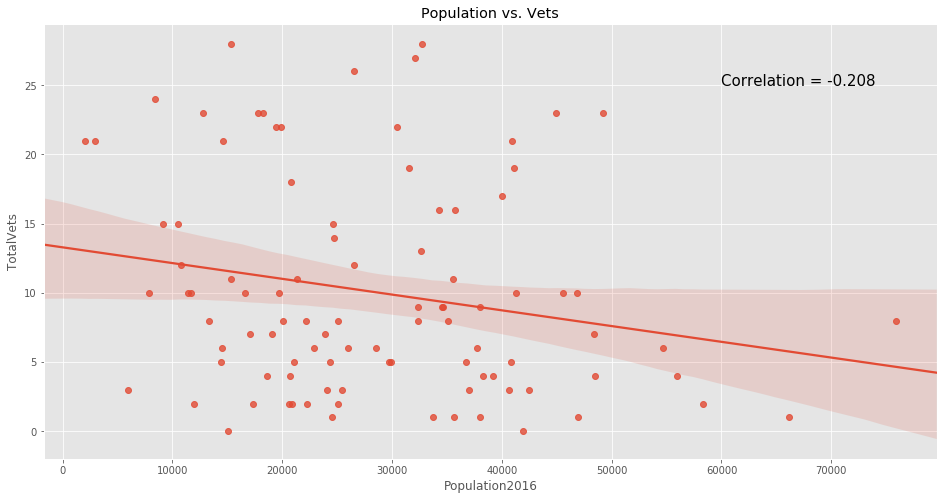

In [97]:
f, ax = plt.subplots(figsize=(16,8))
ax.set_title('Population vs. Vets')
p = sns.regplot(x='Population2016',y='TotalVets',data=df_merged_final,ax=ax);
p.text(60000,25,
       'Correlation = {:.3f}'.format(np.corrcoef(df_merged_final['Population2016'],df_merged_final['TotalVets'])[0,1]),
       fontsize=15);

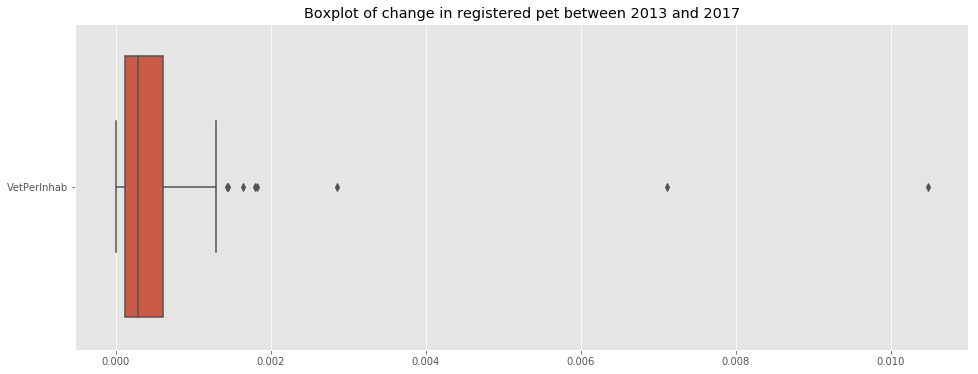

In [98]:
f, ax = plt.subplots(figsize=(16,6))
ax.set_title('Boxplot of change in registered pet between 2013 and 2017')
sns.boxplot(data=df_merged_final[['VetPerInhab']],ax=ax,orient='h');

**Note:** The above distribution shows a uneven distribution in the proportion of vets per neighborhood.

In [99]:
state_geo = data

m = folium.Map(location=[LATITUDE,LONGITUDE], zoom_start=11)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=df_merged_final,
    columns=['PostalCode', 'TotalVets'],
    key_on='feature.properties.CFSAUID',
    fill_color='Accent',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of vets in the proximity of the neighborhood'
).add_to(m)

folium.LayerControl().add_to(m)

m

We now look at the distribution of vets against the pet distribution.  
Below are the neighborhoods with the highest and lowest vet to pet ratio.

In [100]:
df_merged_final[['PostalCode','Borough','Neighborhood','VetPerPet_2017']].sort_values(by='VetPerPet_2017',ascending=True).head(3)

,PostalCode,Borough,Neighborhood,VetPerPet_2017
33,M3N,North York,Downsview Northwest,0.000000
16,M1X,Scarborough,Upper Rouge,0.000000
81,M8V,Etobicoke,"Humber Bay Shores, Mimico South, New Toronto",0.000541


In [101]:
df_merged_final[['PostalCode','Borough','Neighborhood','VetPerPet_2017']].sort_values(by='VetPerPet_2017',ascending=False).head(3)

,PostalCode,Borough,Neighborhood,VetPerPet_2017
58,M5H,Downtown Toronto,"Adelaide, King, Richmond",0.477273
55,M5C,Downtown Toronto,St. James Town,0.230769
57,M5G,Downtown Toronto,Central Bay Street,0.183206


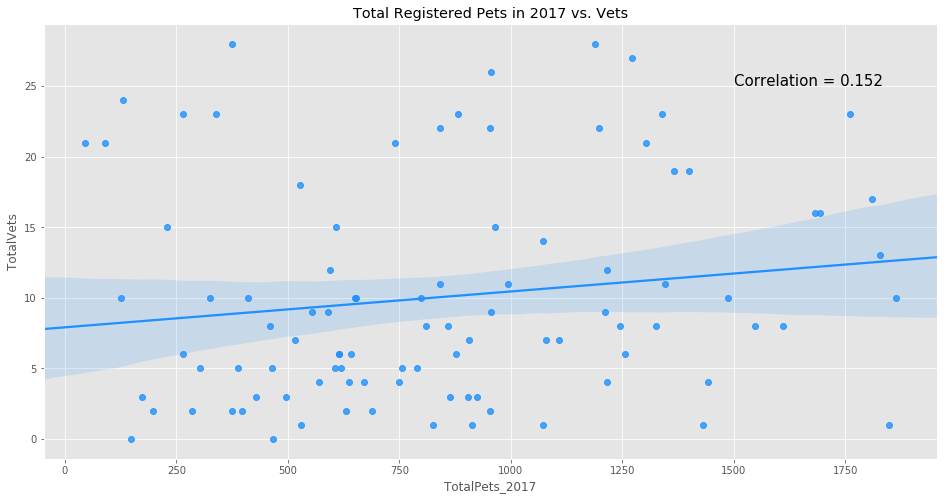

In [102]:
f, ax = plt.subplots(figsize=(16,8))
ax.set_title('Total Registered Pets in 2017 vs. Vets')
p = sns.regplot(x='TotalPets_2017',y='TotalVets',data=df_merged_final,ax=ax,color='dodgerblue');
p.text(1500,25,
       'Correlation = {:.3f}'.format(np.corrcoef(df_merged_final['TotalPets_2017'],df_merged_final['TotalVets'])[0,1]),
       fontsize=15);

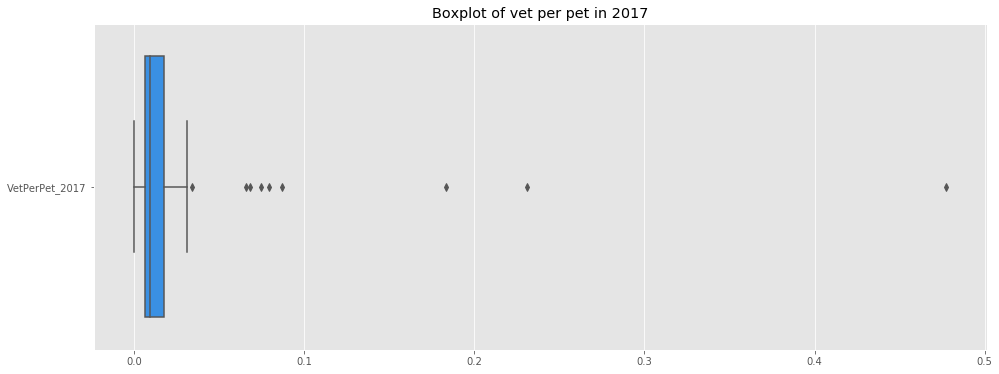

In [103]:
f, ax = plt.subplots(figsize=(16,6))
ax.set_title('Boxplot of vet per pet in 2017')
sns.boxplot(data=df_merged_final[['VetPerPet_2017']],ax=ax,orient='h',color='dodgerblue');

### 7.e. Cat vs Dog Friendly Neighborhoods

In this section we will investigate the distribution of cats and dogs in Toronto.  
First, we look at the neighborhoods where the dogs represent more than 70% of the registered cats and dogs in 2017.

In [104]:
# very dog-friendly neighborhoods
df_merged_final[['PostalCode','Borough','Neighborhood','PropDogs_2017']][df_merged_final['PropDogs_2017']>70].sort_values(by='PropDogs_2017',ascending=False)

,PostalCode,Borough,Neighborhood,PropDogs_2017
58,M5H,Downtown Toronto,"Adelaide, King, Richmond",86.363636
44,M4N,Central Toronto,Lawrence Park,84.185493
50,M4W,Downtown Toronto,Rosedale,82.432432
48,M4T,Central Toronto,"Moore Park, Summerhill East",81.219110
61,M5N,Central Toronto,Roselawn,81.010720
49,M4V,Central Toronto,"Deer Park, Forest Hill SE, Rathnelly, South Hi...",80.272109
60,M5M,North York,"Bedford Park, Lawrence Manor East",79.920319
23,M2P,North York,York Mills West,79.692308
62,M5P,Central Toronto,"Forest Hill North, Forest Hill West",79.664570
55,M5C,Downtown Toronto,St. James Town,78.021978


In [105]:
# extremely dog-friendly neighborhoods
df_merged_final[['PostalCode','Borough','Neighborhood','PropDogs_2017']][df_merged_final['PropDogs_2017']>80].sort_values(by='PropDogs_2017',ascending=False)


,PostalCode,Borough,Neighborhood,PropDogs_2017
58,M5H,Downtown Toronto,"Adelaide, King, Richmond",86.363636
44,M4N,Central Toronto,Lawrence Park,84.185493
50,M4W,Downtown Toronto,Rosedale,82.432432
48,M4T,Central Toronto,"Moore Park, Summerhill East",81.219110
61,M5N,Central Toronto,Roselawn,81.010720
49,M4V,Central Toronto,"Deer Park, Forest Hill SE, Rathnelly, South Hi...",80.272109


**Notes:**  
 - Adelaide, King, Richmond are the neighborhoods with the highest dog proportion (86.36%)
 - Thorncliffe Park is the neighborhood with the lowest dog proportion (54.76%)

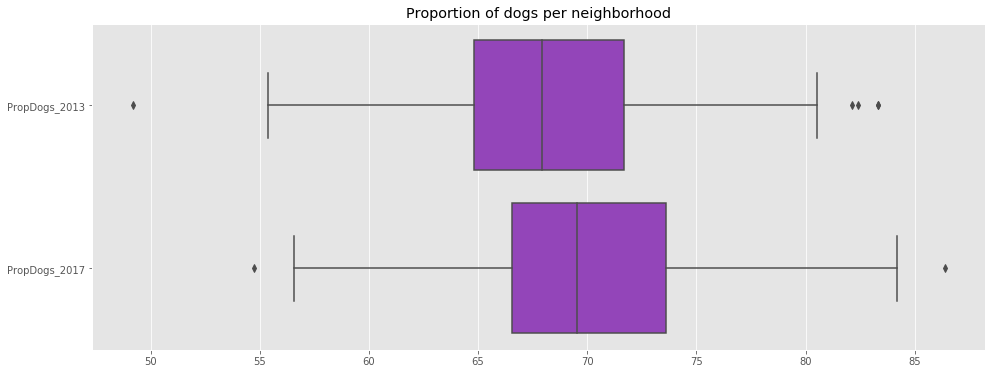

In [106]:
f, ax = plt.subplots(figsize=(16,6))
ax.set_title('Proportion of dogs per neighborhood')
sns.boxplot(data=df_merged_final[['PropDogs_2013','PropDogs_2017']],ax=ax,orient='h',color='darkorchid');

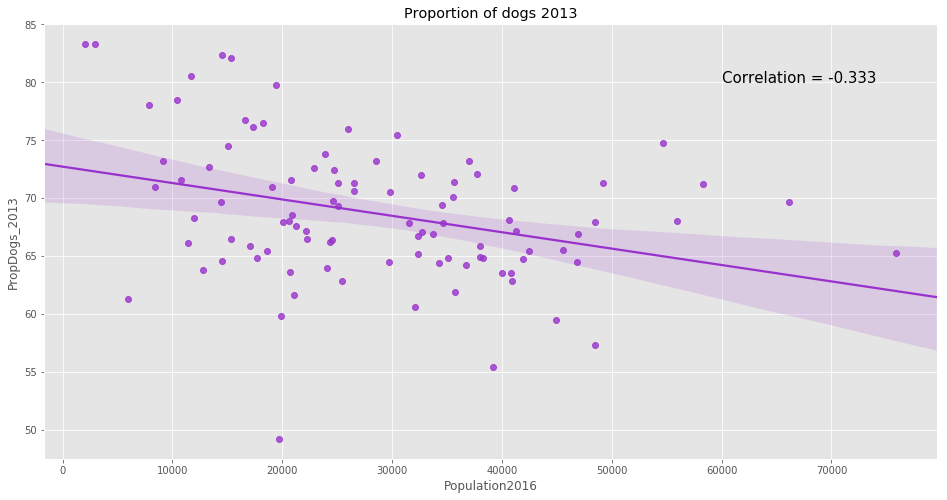

In [107]:
f, ax = plt.subplots(figsize=(16,8))
ax.set_title('Proportion of dogs 2013')
p = sns.regplot(x='Population2016',y='PropDogs_2013',data=df_merged_final,ax=ax,color='darkorchid');
p.text(60000,80,
       'Correlation = {:.3f}'.format(np.corrcoef(df_merged_final['Population2016'],df_merged_final['PropDogs_2013'])[0,1]),
       fontsize=15);

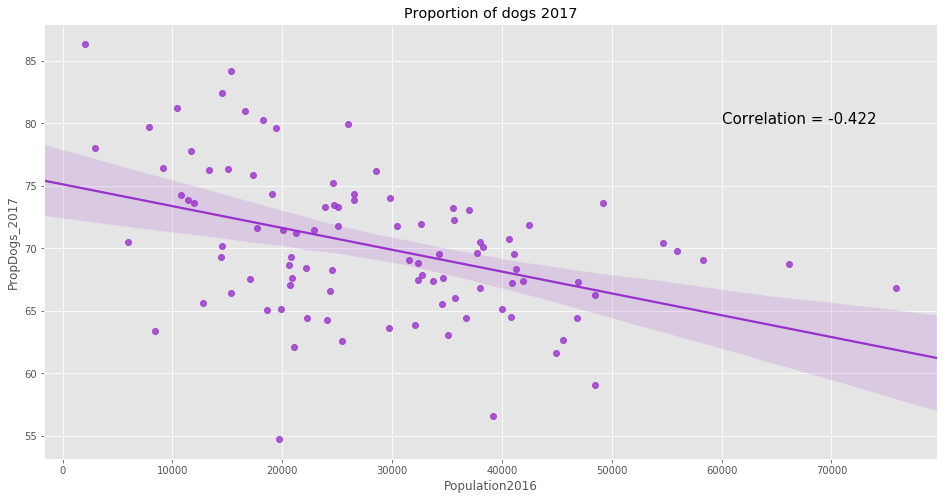

In [108]:
f, ax = plt.subplots(figsize=(16,8))
ax.set_title('Proportion of dogs 2017')
p = sns.regplot(x='Population2016',y='PropDogs_2017',data=df_merged_final,ax=ax,color='darkorchid');
p.text(60000,80,
       'Correlation = {:.3f}'.format(np.corrcoef(df_merged_final['Population2016'],df_merged_final['PropDogs_2017'])[0,1]),
       fontsize=15);

As shown above, there is no neighborhood in 2017 where there are more registered cats than there are registered dogs. In addition, it appears that the propotion of dogs has increased between 2013 and 2017.  
Moreover, the data shows that the more populated the neighborhood, the lesser is the proportion of dogs. This can be explained as dogs requiere more space and people tend to have dogs once they live in houses in neighborhood with a lesser population density.

In [109]:
state_geo = data

m = folium.Map(location=[LATITUDE,LONGITUDE], zoom_start=11)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=df_merged_final,
    columns=['PostalCode', 'PropDogs_2013'],
    key_on='feature.properties.CFSAUID',
    fill_color='BuPu',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Proportion of dogs in 2013'
).add_to(m)

folium.LayerControl().add_to(m)

m

In [110]:
state_geo = data

m = folium.Map(location=[LATITUDE,LONGITUDE], zoom_start=11)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=df_merged_final,
    columns=['PostalCode', 'PropDogs_2017'],
    key_on='feature.properties.CFSAUID',
    fill_color='BuPu',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Proportion of dogs in 2017'
).add_to(m)

folium.LayerControl().add_to(m)

m

### 7.f. Feature correlations

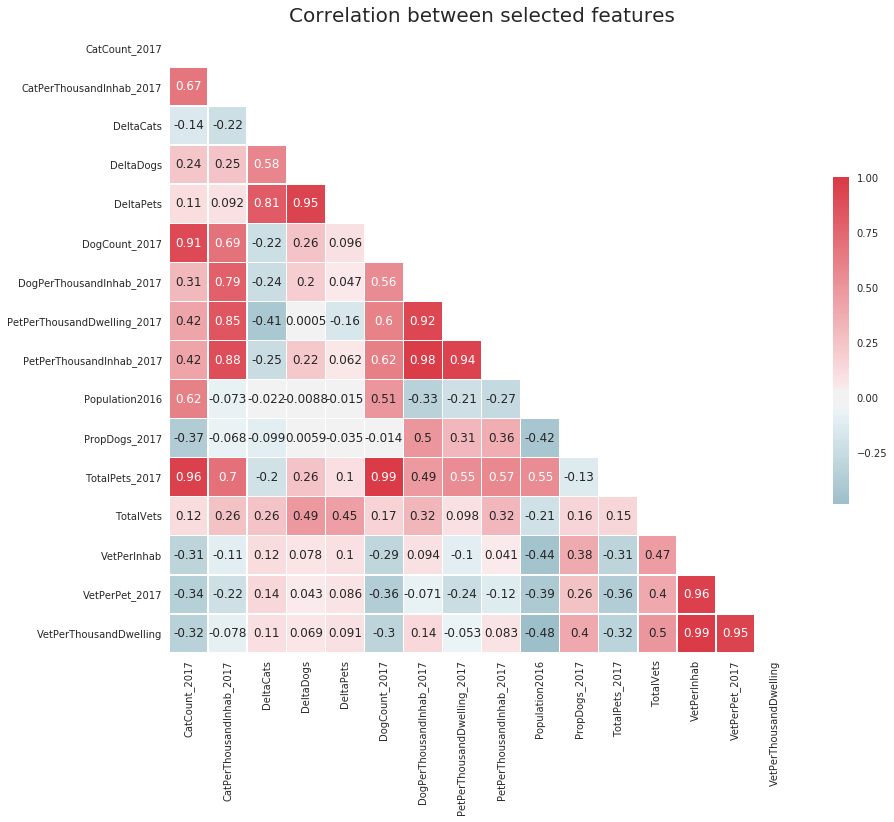

In [111]:
sns.set(style="white")

# Compute the correlation matrix
omitted_columns = ['Latitude','Longitude','CatCount_2013','DogCount_2013',
                   'TotalPets_2013','PropCats_2013','PropDogs_2013','PropCats_2017',
                   'Borough','Dwellings2016','PostalCode']
df_temp = df_merged_final[df_merged_final.columns.difference(omitted_columns)]
corr = df_temp.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(14, 12))
ax.set_title('Correlation between selected features',fontsize=20)

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1.00, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5},
            annot=True,);

## 8. Clustering  

Now that we have a good understanding of the pet and vet distribution in the city, we leverage the power of clustering to find out which neighborhoods are the best candidate for a new veterinarian.

In [112]:
print('Features not included in model:\n')
omitted_columns = ['Latitude','Longitude','CatCount_2013','DogCount_2013',
                   'TotalPets_2013','PropCats_2013','PropDogs_2013','PropCats_2017',
                   'Borough','Dwellings2016','PostalCode','Neighborhood']
selected_columns = df_merged_final.columns.difference(omitted_columns)
print(omitted_columns)

Features not included in model:

['Latitude', 'Longitude', 'CatCount_2013', 'DogCount_2013', 'TotalPets_2013', 'PropCats_2013', 'PropDogs_2013', 'PropCats_2017', 'Borough', 'Dwellings2016', 'PostalCode', 'Neighborhood']


Now that the data has been filtered, we copy in into a training set.

In [113]:
X_train = df_merged_final[selected_columns].copy()
print('Training set ready...')

Training set ready...


In [114]:
print('Scaling data using standard scaler...')
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_train = pd.DataFrame(X_train, index=df_merged_final.index, columns=selected_columns)
X_train.head()
print('Data is scaled.')

Scaling data using standard scaler...
Data is scaled.


In order to group similar neighborhoods, we use a K-means clustering algorithm. We iterate over the number of clusterss in order to find the best value for this hyperparameter.

In [115]:
# define candidates to n_clusters
num_clusters = range(1, 96)

# instantiate the K-means algorithm
kmeans = [KMeans(n_clusters=i,n_init=20,random_state=100) for i in num_clusters]

# store scores
score = [kmeans[i].fit(X_train).score(X_train) for i in range(len(kmeans))]

In [116]:
# compute first derivative of elbow curve
score_prime = np.array(score)
score_prime = np.diff(score_prime,n=1) / score_prime[0:-1]

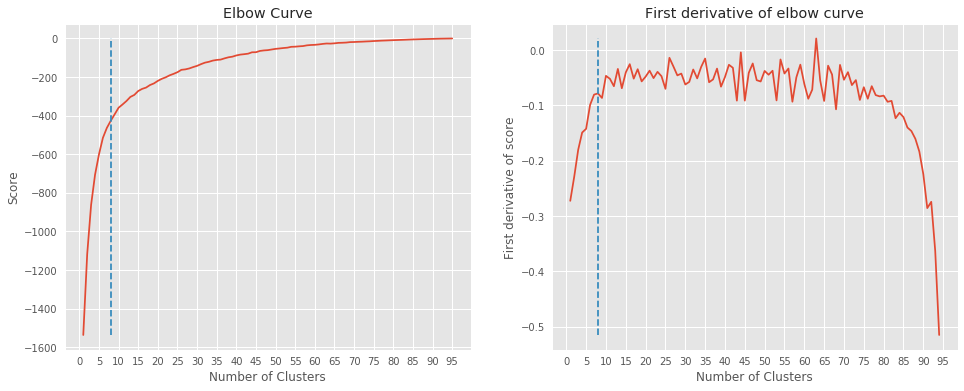

In [117]:
# reset plotting style
plt.style.use('ggplot')

# best n_cluster value
best_param = 8

# create plot
f, axes = plt.subplots(nrows=1, ncols=2,figsize=(16, 6))

# elbow curve
axes[0].plot(num_clusters, score)
axes[0].set_xlabel('Number of Clusters')
axes[0].set_ylabel('Score')
axes[0].set_title('Elbow Curve')
axes[0].set_xticks(list(range(0,96,5)))
axes[0].plot([best_param,best_param],[min(score),max(score)],linestyle='dashed')

# first derivative
axes[1].plot(num_clusters[0:-1],score_prime)
axes[1].set_xlabel('Number of Clusters')
axes[1].set_ylabel('First derivative of score')
axes[1].set_title('First derivative of elbow curve')
axes[1].set_xticks(list(range(0,96,5)))
axes[1].plot([best_param,best_param],[min(score_prime),max(score_prime)],linestyle='dashed');

From the above plot, it appears that the best number of cluster (using the elbow method) is **n_cluster=8**.

In [118]:
# set number of clusters
kclusters = 8

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, n_init=20,random_state=100).fit(X_train)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:5] 

array([5, 1, 1, 5, 0], dtype=int32)

We now insert the results of the clustering to our original dataframe.

In [119]:
df_merged_final['Cluster'] = kmeans.labels_

In [120]:
print('Overview of the clustering:\n')
df_merged_final.head()

Overview of the clustering:



,PostalCode,Borough,Neighborhood,Latitude,Longitude,Population2016,Dwellings2016,CatCount_2013,DogCount_2013,TotalPets_2013,CatCount_2017,DogCount_2017,TotalPets_2017,TotalVets,CatPerThousandInhab_2017,DogPerThousandInhab_2017,PetPerThousandInhab_2017,VetPerPet_2017,VetPerInhab,PetPerThousandDwelling_2017,VetPerThousandDwelling,PropCats_2017,PropDogs_2017,PropCats_2013,PropDogs_2013,DeltaCats,DeltaDogs,DeltaPets,Cluster
0,M1B,Scarborough,"Rouge, Malvern",43.811650,-79.195561,66108.0,20230.0,293,674,967,285,627,912,1,4.311127,9.484480,13.795607,0.001096,0.000015,45.081562,0.049432,31.250000,68.750000,30.299897,69.700103,-8,-47,-55,5
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.785605,-79.158701,35626.0,11274.0,387,967,1354,297,775,1072,1,8.336608,21.753775,30.090383,0.000933,0.000028,95.086039,0.088700,27.705224,72.294776,28.581979,71.418021,-90,-192,-282,1
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.765690,-79.175299,46943.0,17161.0,536,1085,1621,467,963,1430,1,9.948235,20.514241,30.462476,0.000699,0.000021,83.328477,0.058272,32.657343,67.342657,33.066009,66.933991,-69,-122,-191,1
3,M1G,Scarborough,Woburn,43.768216,-79.217610,29690.0,9767.0,252,457,709,220,385,605,5,7.409902,12.967329,20.377231,0.008264,0.000168,61.943278,0.511928,36.363636,63.636364,35.543018,64.456982,-32,-72,-104,5
4,M1H,Scarborough,Cedarbrae,43.769608,-79.239440,24383.0,8985.0,184,361,545,155,309,464,5,6.356888,12.672764,19.029652,0.010776,0.000205,51.641625,0.556483,33.405172,66.594828,33.761468,66.238532,-29,-52,-81,0


We create a map to vizualize the different clusters.

In [121]:
step = folium.StepColormap(['r','cyan','lime','brown',
                            'darkorchid','royalblue','pink','gold','gray'],vmin=0.0, vmax=8)
print('colormap used for to differentiate clusters:')
step

colormap used for to differentiate clusters:


In [122]:
m = folium.Map(location=[LATITUDE,LONGITUDE], zoom_start=11)

folium.GeoJson(
    state_geo,
    style_function=lambda feature: {
        'fillColor': step(df_merged_final.set_index('PostalCode')['Cluster'][feature['properties']['CFSAUID']]),
        'color' : 'black',
        'weight' : 0.5,
        'fillOpacity':0.6
        }
    ).add_to(m)

# set color scheme for the clusters
colors_array = step
rainbow = ['r','cyan','lime','gold','royalblue','darkorchid','pink','black']

# add markers to the map
markers_colors = []

for lat, lon, poi, cluster in zip(df_merged_final['Latitude'], df_merged_final['Longitude'], df_merged_final['Neighborhood'], df_merged_final['Cluster']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    
    folium.CircleMarker(
        [lat, lon],
        radius=2,
        popup=label,
        color='k',
        fill=True,
        fill_color='k',
        fill_opacity=1.0).add_to(m)

folium.LayerControl().add_to(m)

m

Let's now print the average features per cluster.

In [123]:
df_cluster_grouped = df_merged_final.groupby('Cluster').mean()

In [124]:
df_cluster_grouped = df_cluster_grouped.reset_index()
df_cluster_grouped

,Cluster,Latitude,Longitude,Population2016,Dwellings2016,CatCount_2013,DogCount_2013,TotalPets_2013,CatCount_2017,DogCount_2017,TotalPets_2017,TotalVets,CatPerThousandInhab_2017,DogPerThousandInhab_2017,PetPerThousandInhab_2017,VetPerPet_2017,VetPerInhab,PetPerThousandDwelling_2017,VetPerThousandDwelling,PropCats_2017,PropDogs_2017,PropCats_2013,PropDogs_2013,DeltaCats,DeltaDogs,DeltaPets
0,0,43.734991,-79.425017,21540.238095,8096.047619,130.333333,279.761905,410.095238,128.523810,290.428571,418.952381,4.238095,6.017916,13.660045,19.677962,0.012938,0.000223,52.172346,0.555322,31.086708,68.913292,32.817469,67.182531,-1.809524,10.666667,8.857143
1,1,43.695778,-79.389879,31859.300000,12157.400000,439.900000,940.800000,1380.700000,362.000000,880.000000,1242.000000,5.800000,11.950067,29.091641,41.041708,0.004738,0.000199,106.360588,0.507071,29.067330,70.932670,31.627795,68.372205,-77.900000,-60.800000,-138.700000
2,2,43.643396,-79.414120,38726.833333,21568.500000,335.500000,712.000000,1047.500000,404.666667,909.666667,1314.333333,19.000000,10.555946,23.597924,34.153870,0.016242,0.000508,63.313231,0.930246,30.511596,69.488404,31.244641,68.755359,69.166667,197.666667,266.833333
3,3,43.650455,-79.379031,2478.000000,1482.000000,9.000000,45.000000,54.000000,13.000000,54.500000,67.500000,21.000000,4.884941,21.506130,26.391071,0.354021,0.008795,44.137232,14.548409,17.807193,82.192807,16.666667,83.333333,4.000000,9.500000,13.500000
4,4,43.696789,-79.404009,17403.000000,7886.350000,210.400000,566.700000,777.100000,195.400000,600.150000,795.550000,12.800000,11.145870,35.235498,46.381368,0.017221,0.000791,105.503473,1.782889,24.138875,75.861125,26.660046,73.339954,-15.000000,33.450000,18.450000
5,5,43.757426,-79.360637,44190.095238,15848.952381,281.380952,564.095238,845.476190,267.333333,535.428571,802.761905,5.333333,6.227490,12.416248,18.643738,0.007180,0.000131,51.834411,0.363838,33.406597,66.593403,33.242836,66.757164,-14.047619,-28.666667,-42.714286
6,6,43.670267,-79.394138,34940.090909,14957.636364,554.727273,1030.363636,1585.090909,525.363636,1074.818182,1600.181818,16.454545,15.387783,31.988520,47.376304,0.010799,0.000507,110.444708,1.177459,32.866960,67.133040,35.234045,64.765955,-29.363636,44.454545,15.090909
7,7,43.655050,-79.387163,12689.200000,6816.800000,70.200000,141.000000,211.200000,83.000000,184.600000,267.600000,22.600000,6.468906,14.498019,20.966926,0.095643,0.001882,38.323887,3.403225,31.312799,68.687201,32.157574,67.842426,12.800000,43.600000,56.400000


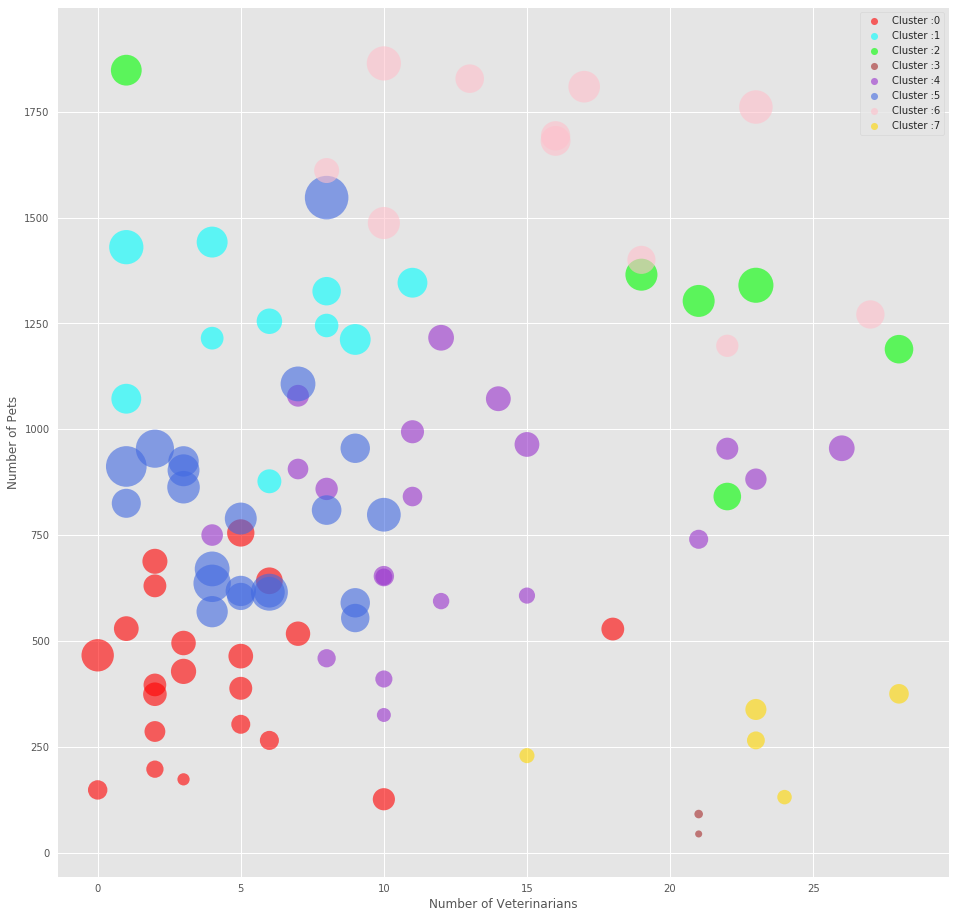

In [125]:
colors = ['red','cyan','lime','brown',
                            'darkorchid','royalblue','pink','gold','gray']

plt.style.use('ggplot')
f, ax = plt.subplots(figsize=(16,16))

for g in np.unique(df_merged_final['Cluster']):
    ax.scatter(x = df_merged_final['TotalVets'][df_merged_final['Cluster']==g],
            y = df_merged_final['TotalPets_2017'][df_merged_final['Cluster']==g],
            marker = 'o',
            linewidth = 0,
            s = df_merged_final['Population2016'][df_merged_final['Cluster']==g]/40,
            c = colors[g],
            label = 'Cluster :' + str(g),
            alpha = 0.6
           )

ax.set_xlabel('Number of Veterinarians')
ax.set_ylabel('Number of Pets')

legend = ax.legend(frameon=True)
for legend_handle in legend.legendHandles:
    legend_handle._sizes = [50]

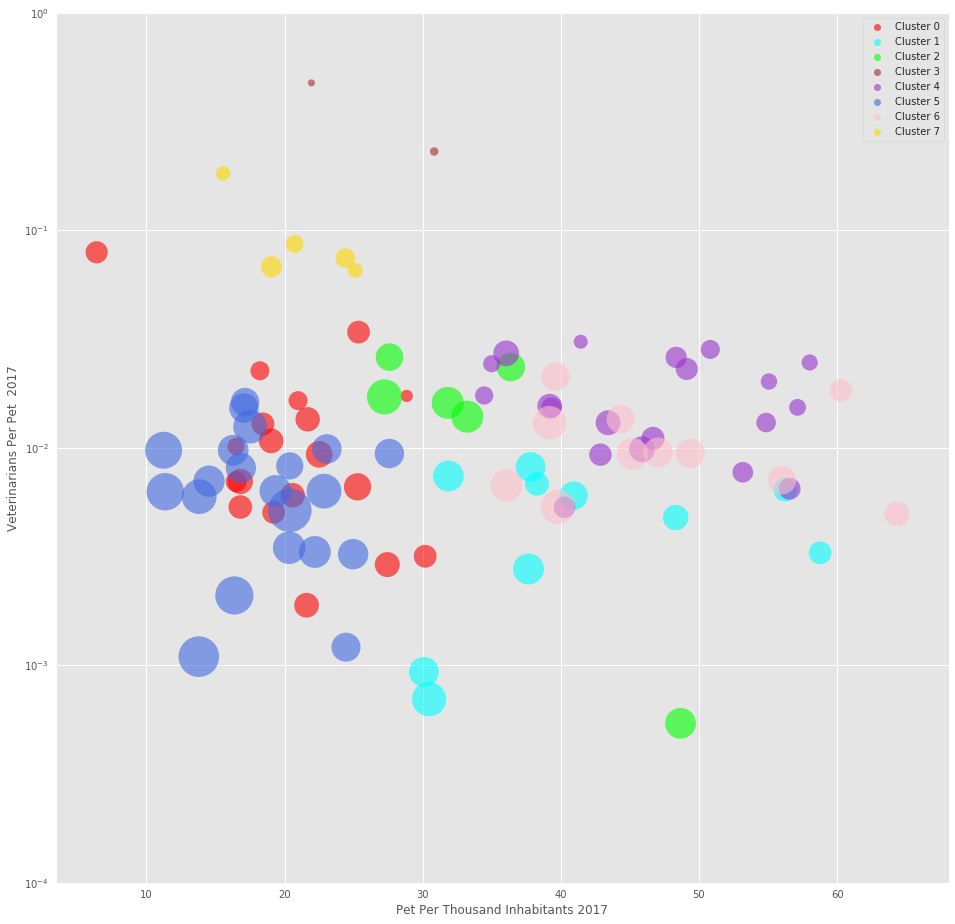

In [126]:
colors = ['red','cyan','lime','brown',
                            'darkorchid','royalblue','pink','gold','gray']

plt.style.use('ggplot')
f, ax = plt.subplots(figsize=(16,16))

for g in np.unique(df_merged_final['Cluster']):
    ax.scatter(x = df_merged_final['PetPerThousandInhab_2017'][df_merged_final['Cluster']==g],
            y = df_merged_final['VetPerPet_2017'][df_merged_final['Cluster']==g],
            marker = 'o',
            linewidth = 0,
            s = df_merged_final['Population2016'][df_merged_final['Cluster']==g]/40,
            c = colors[g],
            label = 'Cluster ' + str(g),
            alpha = 0.6
           )

ax.set_xlabel('Pet Per Thousand Inhabitants 2017')
ax.set_ylabel('Veterinarians Per Pet  2017')
ax.set_yscale("log")
ax.set_ylim([10**-4,10**0])

legend = ax.legend(frameon=True)
for legend_handle in legend.legendHandles:
    legend_handle._sizes = [50]

In [135]:
step = folium.StepColormap(['gray','cyan'],vmin=0.0, vmax=1.0)

m = folium.Map(location=[LATITUDE,LONGITUDE], zoom_start=11)

folium.GeoJson(
    state_geo,
    style_function=lambda feature: {
        'fillColor': step(df_merged_final.set_index('PostalCode')['Cluster'][feature['properties']['CFSAUID']]==1),
        'color' : 'black',
        'weight' : 0.5,
        'fillOpacity':0.6
        }
    ).add_to(m)

folium.LayerControl().add_to(m)

m

We now look at the trend in the number of registered animal for the cluster 1.

In [136]:
df_cluster_1 = df_merged_final[(df_merged_final['Cluster']==1)]

In [137]:
df_cluster_1.head(1)

,PostalCode,Borough,Neighborhood,Latitude,Longitude,Population2016,Dwellings2016,CatCount_2013,DogCount_2013,TotalPets_2013,CatCount_2017,DogCount_2017,TotalPets_2017,TotalVets,CatPerThousandInhab_2017,DogPerThousandInhab_2017,PetPerThousandInhab_2017,VetPerPet_2017,VetPerInhab,PetPerThousandDwelling_2017,VetPerThousandDwelling,PropCats_2017,PropDogs_2017,PropCats_2013,PropDogs_2013,DeltaCats,DeltaDogs,DeltaPets,Cluster
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.785605,-79.158701,35626.0,11274.0,387,967,1354,297,775,1072,1,8.336608,21.753775,30.090383,0.000933,0.000028,95.086039,0.0887,27.705224,72.294776,28.581979,71.418021,-90,-192,-282,1


In [138]:
df_cluster_1[['TotalPets_2013','TotalPets_2017']].set_index(df_cluster_1['PostalCode']).T

PostalCode,M1C,M1E,M1M,M1N,M5M,M6E,M8W,M9A,M9B,M9C
TotalPets_2013,1354,1621,976,1333,1336,1305,1347,1419,1529,1587
TotalPets_2017,1072,1430,877,1245,1255,1212,1215,1346,1326,1442


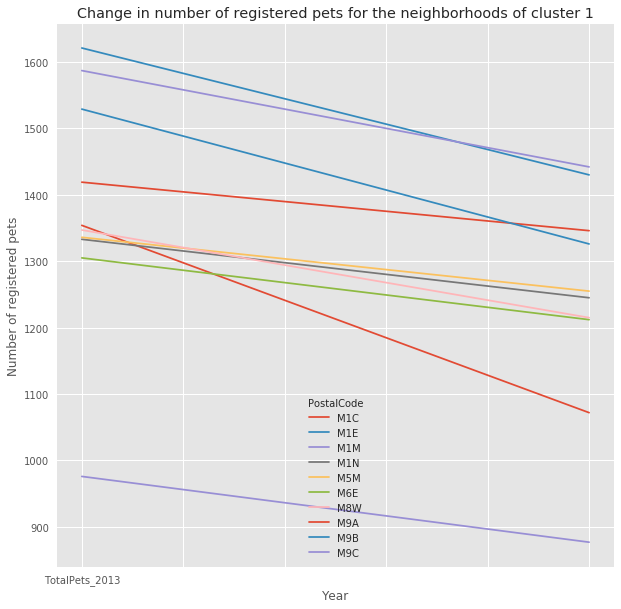

In [139]:
f, ax = plt.subplots(figsize=(10,10))
df_cluster_1[['TotalPets_2013','TotalPets_2017']].set_index(df_cluster_1['PostalCode']).T.plot(ax=ax)
ax.set_title('Change in number of registered pets for the neighborhoods of cluster 1')
ax.set_xlabel('Year')
ax.set_ylabel('Number of registered pets');

In [140]:
df_cluster_1.set_index(df_cluster_1['PostalCode'])['DeltaPets'].sort_values(ascending=False)

PostalCode
M9A    -73
M5M    -81
M1N    -88
M6E    -93
M1M    -99
M8W   -132
M9C   -145
M1E   -191
M9B   -203
M1C   -282
Name: DeltaPets, dtype: int64

**CONCLUSION**:  

With the available data, it seems that the neighborhood M9A represents the best opportunity for a new veterinarian.

In [141]:
m = folium.Map(location=[LATITUDE,LONGITUDE], zoom_start=11)

folium.GeoJson(
    state_geo,
    style_function=lambda feature: {
        'fillColor': step(feature['properties']['CFSAUID']=='M9A'),
        'color' : 'black',
        'weight' : 0.5,
        'fillOpacity':0.6
        }
    ).add_to(m)

folium.LayerControl().add_to(m)

m